# Imports

In [ ]:
! python --version

Python 3.7.10


In [ ]:
!pip install tensorflow_hub
!pip install keras tf-models-official pydot graphviz

     |████████████████████████████████| 1.6MB 7.1MB/s 
     |████████████████████████████████| 102kB 10.4MB/s 
     |████████████████████████████████| 1.2MB 38.4MB/s 
     |████████████████████████████████| 686kB 41.8MB/s 
     |████████████████████████████████| 215kB 30.7MB/s 
     |████████████████████████████████| 358kB 38.7MB/s 
     |████████████████████████████████| 61kB 7.3MB/s 
     |████████████████████████████████| 38.2MB 77kB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-cp37-none-any.whl size=22258 sha256=f3dda6b0e71bafe8685a8b24a9058cc91dd9aa5ec7ad29757872b5191385b9ed
  Stored in directory: /root/.cache/pip/wheels/2e/15/f5/aa2a056d223903b52cf4870134e3a01df0c723816835dd08db
  Created wheel for seqeval: filename=seqeval-1.2.2-cp37-none-any.whl size=16184 sha256=25f14e9ca428f819ce75e1b987e70413a82565b7e11257cac9c414dc2f59b967
  Stored in directory: /root/.cache/pip/wheels/52/df/1b/45d75646c37428f7e626214704a

In [ ]:
import os

import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub

from keras.utils import np_utils

import official.nlp.bert.bert_models
import official.nlp.bert.configs
import official.nlp.bert.run_classifier
import official.nlp.bert.tokenization as tokenization

from official.modeling import tf_utils
from official import nlp
from official.nlp import bert

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("Hub version: ", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

Version:  2.5.0
Eager mode:  True
Hub version:  0.12.0
GPU is NOT AVAILABLE


# Data

For this example you need to download twitter data from Kaggle: https://www.kaggle.com/kazanova/sentiment140

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/<use your dataset reference here>',encoding="utf-8")

In [ ]:
df.head()

,id,label,title,body
0,2632347,4,Ms Chrissy - 22,Tall <br> Sexy<br> Slim<br> 100% real<br> Reas...
1,11645643,1,Everybody loves a Filipina Girl - 29,Hi there Boys it's Miss Sweet 1OO% Filipina gi...
2,15199346,4,NEW Sexy Asian girl⛔️⛔️⛔️⛔️⛔️SUPER HOOOT⛔️⛔️⛔️...,Hello Gentlemen⚜⚜<br> I am Mimi Asian Girl <br...
3,14477454,0,Freaky . TS 🍆🍑 TOP AND BOTTOM (9INCH) fun pack...,• So Treat Yourself to Heaven on Earth...🌍 YOU...
4,11266475,2,❤Kinky Kaylani👑Rear Access &VIP visits👑Great R...,Aren't you tired of the old bait and switch or...


In [ ]:
len(df.body)

12350

In [ ]:
df.dropna(inplace=True)

We have two classes in the dataset

In [ ]:
df.label.unique()

array([4, 1, 0, 2, 3, 5, 6])

In [ ]:
len(df.body)

11850

Let's check how equally distributed those classes are.

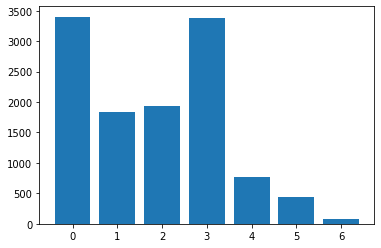

In [ ]:
classes = df.label.unique()
counts = []

for i in classes:
  count = len(df[df.label==i])
  counts.append(count)

plt.bar(['0', '1','2','3','4','5','6'], counts)
plt.show()

To start modelling we still need to do a couple of things:

1.   Split data into train and test datasets
2.   Encode labels
3.   Tokenize text



## Train/test split

We don't really need all 1.6 Million tweets for training so we can take a sample of 5% (to save up time on training) and then split that into 80% for training and 20% for testing.

In [ ]:
sample_size = int(len(df)*1)
sampleDf = df.sample(sample_size, random_state=42)
x = sampleDf.body.values
y = sampleDf.label.values
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)

## Label Encoding

We could get away with other approach but you might want to use this for more than binary classification.

In [ ]:
(sample_size)

11850

In [ ]:
encoder = LabelEncoder()
encoder.fit(y)
encoded_Y_test = encoder.transform(y_test)
encoded_Y_train = encoder.transform(y_train)

# convert integers to dummy variables (i.e. one hot encoded)
dummy_y_test = np_utils.to_categorical(encoded_Y_test)
dummy_y_train = np_utils.to_categorical(encoded_Y_train)

In [ ]:
np.unique(encoded_Y_train)

array([0, 1, 2, 3, 4, 5, 6])

In [ ]:
dummy_y_test.shape

(2370, 7)

In [ ]:
encoded_Y_test

array([4, 4, 1, ..., 2, 2, 4])

In [ ]:
encoded_Y_train

array([1, 2, 2, ..., 2, 3, 4])

We might want to use encoding for later. For that we can save enconding map.

In [ ]:
dummy_y_train.shape

(9480, 7)

In [ ]:
encoder.classes_

array([0, 1, 2, 3, 4, 5, 6])

In [ ]:
encoder_fname = 'trafficking_classes.npy'
my_wd = '/content/drive/My Drive/Upgrad/Masters/human_trafficking_BERT'
np.save(os.path.join(my_wd, encoder_fname) , encoder.classes_)

To load it when you'll use this in production just use the below cell (uncommented ofcourse)

In [ ]:
# encoder = LabelEncoder()
# encoder.classes_ = np.load(os.path.join(my_wd, encoder_fname), allow_pickle=True)

## Tokenization

To tokenize our text we will use some functions from official.nlp.bert package and the pretrained [BERT](https://towardsdatascience.com/bert-explained-state-of-the-art-language-model-for-nlp-f8b21a9b6270) model itself. \\
First we get the BERT model. I'll use the multilingual one as it will be best for most of your cases. To check all NLP models provided by TF HUB go [here](https://tfhub.dev/s?module-type=text-embedding,text-classification,text-generation,text-language-model,text-question-answering,text-retrieval-question-answering).

In [ ]:
bert_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_multi_cased_L-12_H-768_A-12/2",
                            trainable=True)

In [ ]:
vocab_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
do_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = tokenization.FullTokenizer(vocab_file, do_lower_case)

You can see that in above cell we have loaded some variables using the bert_layer we have downloaded. 

1.   ```vocab_file``` reads the vocab file associated to the downloaded model.
2.   ```do_lower_case``` reads binary variable which if ```True``` means tokenizer will reformat all text to lower case rendering model to be **NOT** case sensitive. Should be ```False``` by default. You can check in a cell below.
3.   ```tokenizer``` builds tokenizer using variables 1 and 2.



In [ ]:
do_lower_case

False

Lastly we need to add two additional tokens: Classification and Seperation. We will add these through functions we will use to tokenize our text.

In [ ]:
tokenizer.convert_tokens_to_ids(['[CLS]', '[SEP]'])

[101, 102]

Kewl, by this point we have everything for tokenization. This will take a bit as we have quite a bit of data.

In [ ]:
def encode_names(n):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')  # seperation token. Would be much more useful if you had a multiple text input.
   return tokenizer.convert_tokens_to_ids(tokens)



In [ ]:
body = tf.ragged.constant([
    encode_names(n) for n in x_train])

In [ ]:
print('Tokenized ad text shape', body.shape.as_list())

Tokenized ad text shape [9480, None]


This is to what our tweets have converted to. The ids there are essentially the same as in the simple NN example we did last time, just this time we use a predefined vocabulary.


In [ ]:
body[1]

<tf.Tensor: shape=(66,), dtype=int32, numpy=
array([ 80645,  11259,  31278,  15417,  11403,  14703,  50972,  24339,
        10738,  13966,  50183,  89275,    160,  37611,  12396,  47430,
        94592,  23056,  69196,  12022,  32002,  58573,  93089,  12396,
        40214,  47271,  11369, 100061,  86607,  33809,  58573,  71033,
        11369,  71655,  68560,  50972,  14703,  52428,  47271,  11369,
        53317,  66014,  49248,  24707,  82834,  69308,    157,  11259,
        12674,  11090,    100,    152,  65729,  46900,  82834,  10731,
        49339,  11369,  14703,    106,  11766,  10237,  10237,  12214,
        16757,    102], dtype=int32)>

If you want to see how tokenizer does the "tokenizing" check the cells below.

In [ ]:
x_train[1]

'COME ENJOY AN AMAZING TIME WITH ME MY SENSUAL TOUCH IS ALL YOU NEED TO RELIEVE ANY AND ALL STRESS CALL OR TEXT 📱📱ASHLEY  OUTCALLS ONLY ! 150hh 250hr'

In [ ]:
tokenizedBody = tokenizer.tokenize(x_train[1])
for i in tokenizedBody:
  print(i, tokenizer.convert_tokens_to_ids([i]))

COM [80645]
##E [11259]
EN [31278]
##J [15417]
##O [11403]
##Y [14703]
AN [50972]
AM [24339]
##A [10738]
##Z [13966]
##ING [50183]
TIME [89275]
W [160]
##IT [37611]
##H [12396]
ME [47430]
MY [94592]
SE [23056]
##NS [69196]
##U [12022]
##AL [32002]
TO [58573]
##UC [93089]
##H [12396]
IS [40214]
AL [47271]
##L [11369]
YOU [100061]
NE [86607]
##ED [33809]
TO [58573]
RE [71033]
##L [11369]
##IE [71655]
##VE [68560]
AN [50972]
##Y [14703]
AND [52428]
AL [47271]
##L [11369]
ST [53317]
##RE [66014]
##SS [49248]
CA [24707]
##LL [82834]
OR [69308]
T [157]
##E [11259]
##X [12674]
##T [11090]
[UNK] [100]
O [152]
##UT [65729]
##CA [46900]
##LL [82834]
##S [10731]
ON [49339]
##L [11369]
##Y [14703]
! [106]
150 [11766]
##h [10237]
##h [10237]
250 [12214]
##hr [16757]


We still need to add classification token.

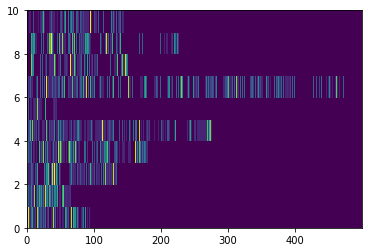

In [ ]:
cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*body.shape[0]
input_word_ids = tf.concat([cls, body], axis=-1)
_ = plt.pcolormesh(input_word_ids[0:10].to_tensor())

What you see above is a graphical representation of our tokenized tweets. First token is our classification token. Other colored blocks than background are other tokens. And background, well that's just padding.

## Mask and input type

The model expects two additional inputs:

* The input mask
* The input type

The mask allows the model to cleanly differentiate between the content and the padding. The mask has the same shape as the `input_word_ids`, and contains a `1` anywhere the `input_word_ids` is not padding.

In [ ]:
input_word_ids

<tf.RaggedTensor [[101, 20065, 10211, 107169, 19029, 10111, 10211, 42374, 10111, 62052, 10142, 13028, 10114, 20575, 10911, 119, 94072, 10173, 53590, 11405, 10111, 27224, 29711, 10123, 10167, 31886, 10106, 14326, 38581, 10106, 169, 14772, 13069, 26287, 119, 12689, 146, 10529, 65817, 10400, 93870, 10454, 15626, 38200, 119, 23553, 10911, 146, 73871, 13028, 11367, 112, 188, 11639, 97309, 10271, 119, 139, 65729, 49339, 11369, 14703, 24707, 82834, 160, 12396, 50655, 100061, 112, 71033, 71033, 55538, 14703, 56658, 11447, 81012, 49307, 13034, 119, 111, 143, 30118, 11090, 17421, 11733, 47430, 123, 23056, 58521, 153, 30889, 10731, 119, 157, 14703, 102], [101, 80645, 11259, 31278, 15417, 11403, 14703, 50972, 24339, 10738, 13966, 50183, 89275, 160, 37611, 12396, 47430, 94592, 23056, 69196, 12022, 32002, 58573, 93089, 12396, 40214, 47271, 11369, 100061, 86607, 33809, 58573, 71033, 11369, 71655, 68560, 50972, 14703, 52428, 47271, 11369, 53317, 66014, 49248, 24707, 82834, 69308, 157, 11259, 12674, 11

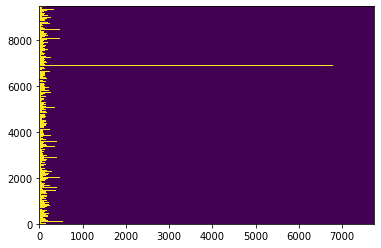

In [ ]:
input_mask = tf.ones_like(input_word_ids).to_tensor()

plt.pcolormesh(input_mask)

Here each yellow block has some input. We just make this for the model to differ between padding and input.

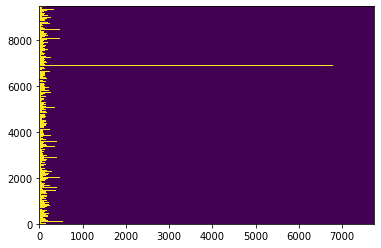

In [ ]:
type_cls = tf.zeros_like(cls)
type_body = tf.ones_like(body)
input_type_ids = tf.concat([type_cls, type_body], axis=-1).to_tensor()

plt.pcolormesh(input_type_ids)

It's hard to see but we added an empty block in front of each tweet for the `[CLS]` token. Check tensor below

In [ ]:
input_type_ids

<tf.Tensor: shape=(9480, 7740), dtype=int32, numpy=
array([[0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0]], dtype=int32)>

## Remake into a function for normal use

So at this point we have all of our three inputs:

1.   Tokens
2.   Input mask
3.   Input type

It will make our work easier both now and in the future if we remake everything into funcitons.



First let's set the max sequence lenght as we did in simple NN example.

In [ ]:
lens = [len(i) for i in input_word_ids]

In [ ]:
max_seq_length = max(lens)
print('Max length is:', max_seq_length)

Max length is: 7740


Most of the time I suggest adding a bit more to the `max_seq_length` esspecially when ussing just a fraction of data. Let's make it `1.5*max_seq_length`.

In [ ]:
max_seq_length = int(1.5*max_seq_length)
print('Max length is:', max_seq_length)

Max length is: 11610


Functions themselves.

In [ ]:
max_seq_length = 512

In [ ]:
def encode_names(n, tokenizer):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')
   return tokenizer.convert_tokens_to_ids(tokens)

def bert_encode(string_list, tokenizer, max_seq_length):
  num_examples = len(string_list)
  
  string_tokens = tf.ragged.constant([
      encode_names(n, tokenizer) for n in np.array(string_list)])

  cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*string_tokens.shape[0]
  input_word_ids = tf.concat([cls, string_tokens], axis=-1)

  input_mask = tf.ones_like(input_word_ids).to_tensor(shape=(None, max_seq_length))

  type_cls = tf.zeros_like(cls)
  type_tokens = tf.ones_like(string_tokens)
  input_type_ids = tf.concat(
      [type_cls, type_tokens], axis=-1).to_tensor(shape=(None, max_seq_length))

  inputs = {
      'input_word_ids': input_word_ids.to_tensor(shape=(None, max_seq_length)),
      'input_mask': input_mask,
      'input_type_ids': input_type_ids}

  return inputs

And now we preprocess inputs.

In [ ]:
X_train = bert_encode(x_train, tokenizer, max_seq_length)
X_test = bert_encode(x_test, tokenizer, max_seq_length)

# Bam MODEL part already

## Initial training

We need to set up our model using the inputs we made, BERT model that we downloaded and an output layer based on num of classes we are using.

In [ ]:
num_class = len(encoder.classes_)  # Based on available class selection
max_seq_length = max_seq_length  # we calculated this a couple cells ago

input_word_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                       name="input_word_ids")
input_mask = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                   name="input_mask")
segment_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                    name="segment_ids")

pooled_output, sequence_output = bert_layer([input_word_ids, input_mask, segment_ids])                                  

output = tf.keras.layers.Dropout(rate=0.1)(pooled_output)

output = tf.keras.layers.Dense(num_class, activation='sigmoid', name='output')(output)

model = tf.keras.Model(
    inputs={
        'input_word_ids': input_word_ids,
        'input_mask': input_mask,
        'input_type_ids': segment_ids
        },
        outputs=output)

Our model.

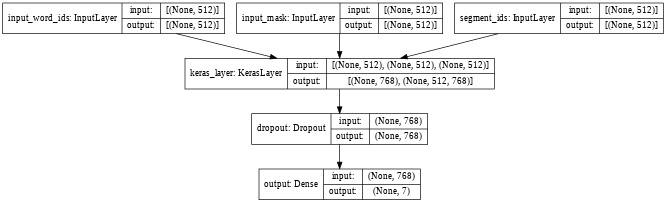

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, dpi=48)

Set up the training parameters.

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-8ee80ef2-709a-8d56-8a78-7a66fb02bed8)


In [ ]:
epochs = 3
batch_size = 8  # select based on your GPU resources
eval_batch_size = batch_size

train_data_size = len(dummy_y_train)
steps_per_epoch = int(train_data_size / batch_size)
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(epochs * train_data_size * 0.1 / batch_size)

optimizer = nlp.optimization.create_optimizer(
    2e-5, num_train_steps=num_train_steps, num_warmup_steps=warmup_steps)

Compile the model.

In [ ]:
model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_word_ids (InputLayer)     [(None, 512)]        0                                            
__________________________________________________________________________________________________
input_mask (InputLayer)         [(None, 512)]        0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 512)]        0                                            
__________________________________________________________________________________________________
keras_layer (KerasLayer)        [(None, 768), (None, 177853441   input_word_ids[0][0]             
                                                                 input_mask[0][0]             

Set up a history to check our model performance afterwards.

In [ ]:
type(X_train)

dict

In [ ]:
len(dummy_y_train)

9480

In [ ]:
type(X_test)

dict

In [ ]:
len(dummy_y_test)

2370

In [ ]:
history = model.fit(X_train,
                    dummy_y_train,
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X_test, dummy_y_test),
                    verbose=1)

Epoch 1/3
1185/1185 [==============================] - 1382s 1s/step - loss: 1.4525 - accuracy: 0.4481 - val_loss: 1.3192 - val_accuracy: 0.5089
Epoch 2/3
1185/1185 [==============================] - 1376s 1s/step - loss: 1.3019 - accuracy: 0.5079 - val_loss: 1.2733 - val_accuracy: 0.5076
Epoch 3/3
1185/1185 [==============================] - 1376s 1s/step - loss: 1.1769 - accuracy: 0.5617 - val_loss: 1.2927 - val_accuracy: 0.5139


Evaluation

In [ ]:
loss, accuracy = model.evaluate(X_train, dummy_y_train, verbose=False)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_test, dummy_y_test, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))

Training Accuracy: 0.6118
Testing Accuracy:  0.5139


Noice plots are noice

In [ ]:
plt.style.use('ggplot')

def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(x, acc, 'b', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

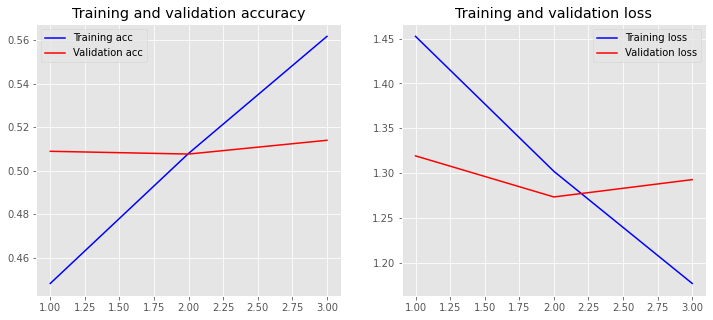

In [ ]:
plot_history(history)

So, looking at the plot above we can see that at the 3rd epoch our `Validation Loss` jumped significantly even though `Validation Accuracy` stayed pretty much the same. If we would train it more on the same data it would significantly overtrain. \\
What we can do instead is make another training dataset, lower our learning rate commonly denoted as `lr`, recompile our model using new `lr` and then train it a bit more. \\
But before doing that we should save our model just in case if we would want to do the additional training in later sessions.

## Model saving for later use

Let's save our model for later use. Unfortunatelly we can't use the optimizer we used for model training to save. I get an error and I can't resolve it. So we will recompile our model before saving.

In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model_fname = 'human_trafficking_BERT'
my_wd = '/content/drive/My Drive/Upgrad/Masters/'

model.save(os.path.join(my_wd, model_fname))

INFO:tensorflow:Assets written to: /content/drive/My Drive/Upgrad/Masters/human_trafficking_BERT/assets


INFO:tensorflow:Assets written to: /content/drive/My Drive/Upgrad/Masters/human_trafficking_BERT/assets


### Validate saved model

Sometimes TF likes to corrupt your model when saving. It's always a good idea to check if everything loads correctly after save.

In [ ]:
model_fname = 'human_trafficking_BERT'
my_wd = '/content/drive/My Drive/Upgrad/Masters/'

new_model = tf.keras.models.load_model(os.path.join(my_wd, model_fname))

In [ ]:
loss, accuracy = new_model.evaluate(X_test, dummy_y_test, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))

Testing Accuracy:  0.5139


In [ ]:
new_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_word_ids (InputLayer)     [(None, 512)]        0                                            
__________________________________________________________________________________________________
input_mask (InputLayer)         [(None, 512)]        0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 512)]        0                                            
__________________________________________________________________________________________________
keras_layer (KerasLayer)        [(None, 768), (None, 177853441   input_word_ids[0][0]             
                                                                 input_mask[0][0]             

For safety reasons I would check the tokenizer variables as well.

In [ ]:
tokenizerSaved = bert.tokenization.FullTokenizer(
    vocab_file=os.path.join(my_wd, model_fname, 'assets/vocab.txt'),
    do_lower_case=False)

If this loads, you should be fine.

In [ ]:
tokenizedText = tokenizerSaved.tokenize(x_train[0])
for i in tokenizedText:
  print(i, tokenizerSaved.convert_tokens_to_ids([i]))

Hi [20065]
im [10211]
Britt [107169]
##ney [19029]
and [10111]
im [10211]
ready [42374]
and [10111]
waiting [62052]
for [10142]
you [13028]
to [10114]
call [20575]
me [10911]
. [119]
Safe [94072]
con [10173]
##veni [53590]
##ent [11405]
and [10111]
disc [27224]
##ree [29711]
##t [10123]
In [10167]
calls [31886]
in [10106]
Fort [14326]
Pierce [38581]
in [10106]
a [169]
great [14772]
Lo [13069]
##cation [26287]
. [119]
And [12689]
I [146]
have [10529]
bel [65817]
##ie [10400]
##vab [93870]
##ly [10454]
low [15626]
rates [38200]
. [119]
Call [23553]
me [10911]
I [146]
promise [73871]
you [13028]
won [11367]
' [112]
t [188]
re [11639]
##gret [97309]
it [10271]
. [119]
B [139]
##UT [65729]
ON [49339]
##L [11369]
##Y [14703]
CA [24707]
##LL [82834]
W [160]
##H [12396]
##EN [50655]
YOU [100061]
' [112]
RE [71033]
RE [71033]
##AD [55538]
##Y [14703]
RI [56658]
##G [11447]
##HT [81012]
NO [49307]
##W [13034]
. [119]
& [111]
F [143]
##ON [30118]
##T [11090]
AS [17421]
##K [11733]
ME [47430]
2 [1

As everything seems fine, we can move on to second training itteration and try to make our model a bit better.

## Second training itteration

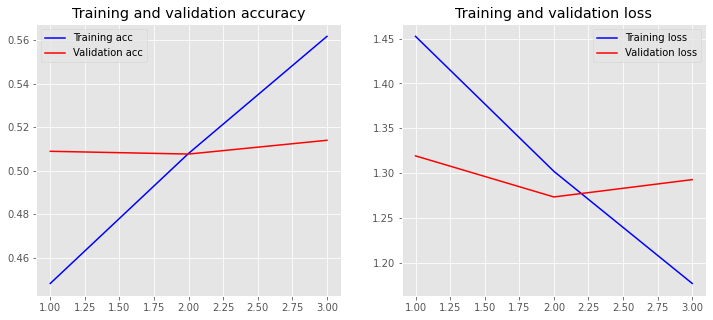

In [ ]:
plot_history(history)

### Data

First we need to prep our data. It's good that we made our processing easier making some functions. Let's take another 5% sample from our data.

In [ ]:
sample_size = int(len(df)*0.75)
sampleDf = df.sample(sample_size, random_state=42)  # notice the random state changes
x = sampleDf.body.values
y = sampleDf.label.values
x_train2, x_test2, y_train2, y_test2 = train_test_split(x, y, test_size=0.20, random_state=42)  # notice the random state changes

[0 2 1 3 4 6 5]


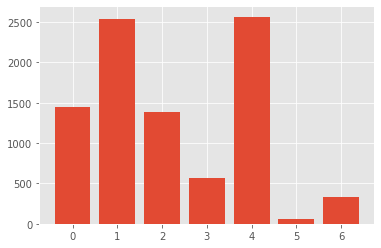

In [ ]:
classes = sampleDf.label.unique()
print(classes)
counts = []

for i in classes:
  count = len(sampleDf[sampleDf.label==i])
  counts.append(count)

plt.bar(['0', '1','2','3','4','5','6'], counts)
plt.show()

It's not a bad idea to always check if your sample is representitive of the dataset itself. Most of the time it will, but when getting small samples it might be off in small datasets.

#### Label Encoding
Now we need to encode labels again. Good thing we have our label encoder saved.

In [ ]:
encoder_fname = 'trafficking_classes.npy'
my_wd = '/content/drive/My Drive/Upgrad/Masters/human_trafficking_BERT/'

encoder = LabelEncoder()
encoder.classes_ = np.load(os.path.join(my_wd, encoder_fname), allow_pickle=True)

encoded_Y_test2 = encoder.transform(y_test2)
encoded_Y_train2 = encoder.transform(y_train2)

# convert integers to dummy variables (i.e. one hot encoded)
dummy_y_test2 = np_utils.to_categorical(encoded_Y_test2)
dummy_y_train2 = np_utils.to_categorical(encoded_Y_train2)

#### Input preprocessing
As we did before we need to tokenize our inputs (tweets) as `input_word_ids` and then add `input_mask` and `input_type`. As we saved our model, we can use it to build our tokenizer as it was.

In [ ]:
model_fname = 'human_trafficking_BERT'
my_wd = '/content/drive/<location of saved tokenizer>'

tokenizerSaved = bert.tokenization.FullTokenizer(
    vocab_file=os.path.join(my_wd, model_fname, 'assets/vocab.txt'),
    do_lower_case=False)

I repaste our encoding functions here so it would be easier to follow.

In [ ]:
def encode_names(n, tokenizer):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')
   return tokenizer.convert_tokens_to_ids(tokens)

def bert_encode(string_list, tokenizer, max_seq_length):
  num_examples = len(string_list)
  
  string_tokens = tf.ragged.constant([
      encode_names(n, tokenizer) for n in np.array(string_list)])

  cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*string_tokens.shape[0]
  input_word_ids = tf.concat([cls, string_tokens], axis=-1)

  input_mask = tf.ones_like(input_word_ids).to_tensor(shape=(None, max_seq_length))

  type_cls = tf.zeros_like(cls)
  type_tokens = tf.ones_like(string_tokens)
  input_type_ids = tf.concat(
      [type_cls, type_tokens], axis=-1).to_tensor(shape=(None, max_seq_length))

  inputs = {
      'input_word_ids': input_word_ids.to_tensor(shape=(None, max_seq_length)),
      'input_mask': input_mask,
      'input_type_ids': input_type_ids}

  return inputs

As you can see in the functions we use max_seq_length to convert our tweets into inputs. We can't really change it from the one used to build our model as it is in the model structure itself. See below.

In [ ]:
print('Max sequence length is:', max_seq_length)

Max sequence length is: 512


In [ ]:
max_seq_length = 512

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_word_ids (InputLayer)     [(None, 512)]        0                                            
__________________________________________________________________________________________________
input_mask (InputLayer)         [(None, 512)]        0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 512)]        0                                            
__________________________________________________________________________________________________
keras_layer (KerasLayer)        [(None, 768), (None, 177853441   input_word_ids[0][0]             
                                                                 input_mask[0][0]             

You can see that all of the `InputLayers` have a shape of (0, 240) which is (0, `max_seq_length`). For that reason we must use the same `max_seq_length` for our model to understand the inputs it gets.

Now we will use the above functions to make all 3 of our inputs.

In [ ]:
X_train2 = bert_encode(x_train2, tokenizerSaved, max_seq_length)
X_test2 = bert_encode(x_test2, tokenizerSaved, max_seq_length)

In [ ]:
x_train2[0]

"Hi Gentlemen <br>  I'm Marina and If you're looking for a discreet  sensual companion and are tired of the games  I'm the girl for you. Whether you want to relax or if you're in the mood to party  let me give you an expirience to remember. I'll give you a night you will be telling all of your friends about!! Independent!  100% real pictures!!<br> <br> Donation:<br> 300 hourly 1500 all night <br> Credit cards accepted <br> <br> Marina<br> Call or text  Out calls only"

### Training

Firstly let's load our saved model.

In [ ]:
model_fname = 'human_trafficking_BERT'
my_wd = '/content/drive/<location of saved model>'

new_model = tf.keras.models.load_model(os.path.join(my_wd, model_fname))
new_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_word_ids (InputLayer)     [(None, 512)]        0                                            
__________________________________________________________________________________________________
input_mask (InputLayer)         [(None, 512)]        0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 512)]        0                                            
__________________________________________________________________________________________________
keras_layer (KerasLayer)        [(None, 768), (None, 177853441   input_word_ids[0][0]             
                                                                 input_mask[0][0]             

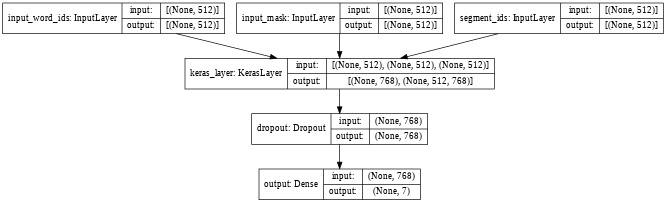

In [ ]:
tf.keras.utils.plot_model(new_model, show_shapes=True, dpi=48)

To check training progress we can use the new and the old testing datasets. Their accuracy should be close. Let's see how it compares.

In [ ]:
loss, accuracy = new_model.evaluate(X_test, dummy_y_test, verbose=False)  # OLD
print("Old testing Accuracy:  {:.4f}".format(accuracy))

loss, accuracy = new_model.evaluate(X_test2, dummy_y_test2, verbose=False)  # NEW
print("New testing Accuracy:  {:.4f}".format(accuracy))

Old testing Accuracy:  0.5139
New testing Accuracy:  0.5855


As you can see there's some difference. In any case, I suggest you use the same testing sample to proceed with you training no matter if the accuracy is the same. This of course applies only to when you do not train on the full dataset.

We need to setup our training parameters again.

In [ ]:
epochs = 3
batch_size = 8  # select based on your GPU resources
eval_batch_size = batch_size

train_data_size = len(dummy_y_train2)
steps_per_epoch = int(train_data_size / batch_size)
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(epochs * train_data_size * 0.1 / batch_size)

NameError: ignored

Now the optimizer we use has learing rate decay in it. Which means learning rate goes down over time by the set parameters. We can lower the initial learning rate for this training session or we could use other optimizer with a fixed learning rate altogether.

In [ ]:
optimizer = nlp.optimization.create_optimizer(
    2e-6, num_train_steps=num_train_steps, num_warmup_steps=warmup_steps)

Let's compile our model.

In [ ]:
new_model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

And now finally we can train again and see if that helps us achieve a better accuracy.

In [ ]:
history2 = new_model.fit(X_train2,  # using new training set
                         dummy_y_train2,  # using new training set
                         epochs=epochs,
                         batch_size=batch_size,
                         validation_data=(X_test, dummy_y_test),  # using old test dataset
                         verbose=1)

NameError: ignored

Let's plot everything out.

In [ ]:
for i in history2.history:
  for ele in history2.history[i]:
    history.history[i].append(ele)

In [ ]:
plot_history(history)

Our lines aren't consistent as we changed the training dataset. However, you can see that both the `val_accuracy` and `val_loss` improved. At his point we could itterate again and improve the model a bit more and more. Just understand that every incrimental improvement will take more data/time as it significantly slows down over time.

# Test

We need to check in with our label encoder to get our classes.

In [ ]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
import os as os
encoder_fname = 'trafficking_classes.npy'
my_wd = '/content/drive/My Drive/Upgrad/Masters/human_trafficking_BERT/'

encoder = LabelEncoder()
encoder.classes_ = np.load(os.path.join(my_wd, encoder_fname), allow_pickle=True)

This is how our classes are encoded for the model.

In [ ]:
encoder.classes_

array([0, 1, 2, 3, 4, 5, 6])

Input preprocessing.

In [ ]:
text = [r'Are you stressed and need Some hot reliever? I’m a horny mature girl, I love squirting 💦 I Wanna fulfill your widest sexual fantasies 👅 I’ll satisfy you with my full service such as ****, oral, doggy, hardcore I can ride your cock 🍆 till you beg me to stop., I’m 💯 honest and sincere lady you’d ever love to meet 😍 I’m available all day and night for incall and outcall... text me for rate and unforgettable 💧 experience 💋 💯% Real & Ready Now👅🍭Naughty Fun💋My Place Or Yours💋im always available']
#text = [r'Hello Gentlemenâšœâšœ<br> I am Mimi Asian Girl <br> I am a sweet KOREAN girl with silky long hair  Natrual Sexy body and great serviceï¼<br> Treat you like a King and NEVER RUSH! My pics are real and recent <br> I like deep kissing.. ðŸ’‹ðŸ’‹ðŸ’‹ðŸ’‹<br> I enjoy kissing ur whole body slowly. I know how to treat a gentleman. <br> Age : 22<br> Measurements : 36D-24-34<br> Height : 5']
#text = ['MY WET*** IS READY TO TAKE IN SOME GOOD HARD COCK THAT WANT SOME JUICES ❤️❤️ I OFFER INCALL AND OUT CALL AND I HAVE NO LIMIT ALWAYS ASK FOR MY DONATION, IM READY TO DO WHAT YOUR GF OR WIFE CANT DO']
inputs = bert_encode(string_list=list(text), 
                     tokenizer=tokenizerSaved, 
                     max_seq_length=512)

Prediction.

In [ ]:
prediction = new_model.predict(inputs)
print(prediction)
#print('Tweet is', 'positive' if encoder.classes_[np.argmax(prediction)]==4 else 'negative')

[[0.15213722 0.45104015 0.887089   0.4143432  0.7291974  0.35497358
  0.10239133]]


In [ ]:
np.argmax(prediction)

2

In [ ]:
encoder.classes_[np.argmax(prediction)]

2

In [ ]:
inputs

{'input_mask': <tf.Tensor: shape=(1, 512), dtype=int32, numpy=
 array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0